In [1]:
import os
import torch
import numpy as np
from matplotlib import pyplot as plt
from smalldiffusion.wavedata import npyDataResized
from torch.utils.data import DataLoader
from smalldiffusion.model import Scaled
from smalldiffusion.model_unet import myUnet
from smalldiffusion.diffusion import ScheduleLogLinear, ScheduleDDPM, samples, samples_thres
from accelerate import Accelerator
from torch_ema import ExponentialMovingAverage as EMA
from torchvision import transforms as tf

%load_ext autoreload
%autoreload 2

## Checking climatology of a particular month

### Construct test month

In [20]:
file_path = '/global/homes/j/jiarongw/scratch_folder/wave_data/train_global/'
month = 6
file_names = [(f'wave_{i:04d}{month:02d}', f'forcing_{i:04d}{month:02d}') for i in range(2012,2013)]

file_list = [(os.path.join(file_path, f'{x}.npy'), 
              os.path.join(file_path, f'{f}.npy')) for x, f in file_names]   
data = npyDataResized(
    file_list,
    resize_x=(320,320), resize_f=(320,320), 
    landmaskname=os.path.join(file_path, 'mask.npy'),
    use_icymask=True, compute_stats=True,
)

print('Computing climatological maps...')
meanx, stdx, meanf, stdf = data.compute_clim_map()

Computing dataset mean and std across all files...
Computing climatological maps...


### Load model

In [3]:
RESUME = True
epoch = 16
path = '/global/homes/j/jiarongw/scratch_folder/log1p/DDPM3/'
weights_file = path + f'ckpt_{epoch}.pt'

model = Scaled(myUnet)(in_dim=320, in_ch=4, out_ch=4, ch=192, precond_ch=3, 
                       scale=(torch.tensor([0.,0.,0.,0.]), torch.tensor([0.,0.,0.,0.]),
                              torch.tensor([0.,0.,0.,]), torch.tensor([0.,0.,0.,])),
                       ch_mult=(1, 2, 2), attn_resolutions=(16,))
ema = EMA(model.parameters(), decay=0.999)
if RESUME:
    ckpt = torch.load(weights_file, map_location="cpu")
    model.load_state_dict(ckpt["model"])
    ema.load_state_dict(ckpt["ema"])

pytorch_total_params = sum(p.numel() for p in model.parameters())
print(f"Total Parameters: {pytorch_total_params}")
pytorch_trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total Trainable Parameters: {pytorch_trainable_params}")

Total Parameters: 55147972
Total Trainable Parameters: 55147972


In [4]:
### Helper function
def invert_x_bc_hw(data, x, mask):
    """ x:    (B, C, H, W), mask: (B, Hm, Wm) or (B, 1, Hm, Wm) """
    B = x.shape[0]
    x_out = []
    for b in range(B):
        # invert single sample
        xb = data.invert_x(x[b])          # (C, H, W)
        xb = xb * tf.Resize((320,720))(mask[b].to(x))
        x_out.append(xb)
    return torch.stack(x_out, dim=0)

### Generate (or load from file)

In [33]:
GUIDED = False
batch_size = 2
schedule_infer = ScheduleDDPM(N=700)
a = Accelerator()
loader = DataLoader(data, batch_size=batch_size, shuffle=False)
model, loader = a.prepare(model, loader)
ema.to(a.device)
model.eval()

myUnetScaled(
  (sig_embed): SigmaEmbedderSinCos(
    (mlp): Sequential(
      (0): Linear(in_features=2, out_features=768, bias=True)
      (1): SiLU()
      (2): Linear(in_features=768, out_features=768, bias=True)
    )
  )
  (conv_in): Conv2d(7, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Module(
      (blocks): ModuleList(
        (0-1): 2 x CondSequential(
          (0): ResnetBlock(
            (layer1): Sequential(
              (0): GroupNorm(32, 192, eps=1e-06, affine=True)
              (1): SiLU()
              (2): Conv2d(192, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            )
            (temb_proj): Sequential(
              (0): SiLU()
              (1): Linear(in_features=768, out_features=192, bias=True)
            )
            (layer2): Sequential(
              (0): GroupNorm(32, 192, eps=1e-06, affine=True)
              (1): SiLU()
              (2): Dropout(p=0.1, inplace=False)
              (3): C

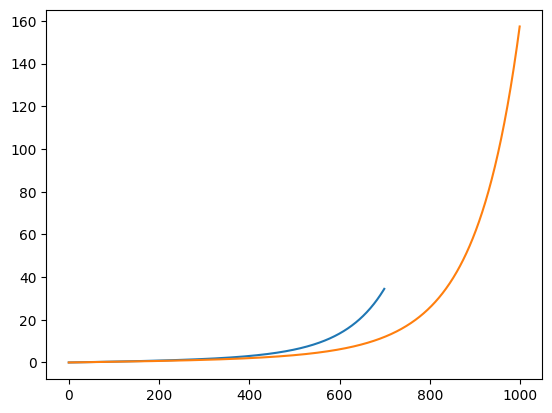

In [34]:
schedule_infer = ScheduleDDPM(N=700)
plt.plot(schedule_infer.sigmas)
schedule_infer = ScheduleDDPM(N=1000)
plt.plot(schedule_infer.sigmas)

In [34]:
%%time
# x_sampled = np.zeros((len(loader), 4, 320, 720))
with torch.no_grad():
    x_sampled = []
    with ema.average_parameters():
        for i, (x, f, mask) in enumerate(loader):
            print(f'Generating batch {i} ...')
            if GUIDED:
                hs_thres = -data.meanx[0]/data.stdx[0]
                *xt, x0 = samples_thres(model, schedule_infer.sample_sigmas(100), gam=1, mu=0.5, batchsize=x.shape[0], 
                                        thres=hs_thres, accelerator=a, cond=f, mask=mask)
            else:
                *xt, x0 = samples(model, schedule_infer.sample_sigmas(100), gam=1, mu=0.5, batchsize=x.shape[0],
                                  accelerator=a, cond=f, mask=mask)
    
            ##### TODO: Make this inversion batch wise!
            x_ = invert_x_bc_hw(data, x0, mask)
            # x_sampled[i] = x_.cpu().numpy().mean(axis=0)
            x_sampled.extend(x_.cpu().numpy())

Generating batch 0 ...
Generating batch 1 ...
Generating batch 2 ...
Generating batch 3 ...
Generating batch 4 ...
Generating batch 5 ...
Generating batch 6 ...
Generating batch 7 ...
Generating batch 8 ...
Generating batch 9 ...
Generating batch 10 ...
Generating batch 11 ...
Generating batch 12 ...
Generating batch 13 ...
Generating batch 14 ...
Generating batch 15 ...
Generating batch 16 ...
Generating batch 17 ...
Generating batch 18 ...
Generating batch 19 ...
Generating batch 20 ...
Generating batch 21 ...
Generating batch 22 ...
Generating batch 23 ...
Generating batch 24 ...
Generating batch 25 ...
Generating batch 26 ...
Generating batch 27 ...
Generating batch 28 ...
Generating batch 29 ...
Generating batch 30 ...
Generating batch 31 ...
Generating batch 32 ...
Generating batch 33 ...
Generating batch 34 ...
Generating batch 35 ...
Generating batch 36 ...
Generating batch 37 ...
Generating batch 38 ...
Generating batch 39 ...
Generating batch 40 ...
Generating batch 41 ...
Ge

In [35]:
np.save('sampled_DDPM_less_epsilon_june.npy', np.array(x_sampled))

In [36]:
# x_sampled = np.load('sampled_DDPM_less_epsilon_2.npy')
meanx_sampled = np.average(x_sampled, axis=0)
stdx_sampled = np.std(x_sampled, axis=0)

### Generating videos

#### Sampled

In [41]:
for i in range(0, x_sampled.shape[0]):
    fig, axes = plt.subplots(2, 2, figsize=(20, 10))
    img0 = axes[0,0].imshow(x_sampled[i][0,::-1], vmin=0, vmax=10, cmap='Blues')
    img1 = axes[0,1].imshow(x_sampled[i][1,::-1], vmin=0, vmax=300, cmap='Reds')
    img2 = axes[1,0].imshow(x_sampled[i][2,::-1], vmin=0, vmax=360, cmap='twilight_r')
    img3 = axes[1,1].imshow(x_sampled[i][3,::-1], vmin=0, vmax=90, cmap='Greys')
    plt.savefig(f'../run/plots/sample{i}.png')
    plt.close(fig)

#### Truth

In [20]:
for i in range(0, x_sampled.shape[0]):
    x, f, mask = data.__getitem__(i)
    x_ = data.invert_x(x)
    x_truth = x_ * tf.Resize((320,720))(mask.to(x_))
    fig, axes = plt.subplots(2, 2, figsize=(20, 10))
    img0 = axes[0,0].imshow(x_truth.cpu().numpy()[0,::-1], vmin=0, vmax=10, cmap='Blues')
    img1 = axes[0,1].imshow(x_truth.cpu().numpy()[1,::-1], vmin=0, vmax=300, cmap='Reds')
    img2 = axes[1,0].imshow(x_truth.cpu().numpy()[2,::-1], vmin=0, vmax=360, cmap='twilight_r')
    img3 = axes[1,1].imshow(x_truth.cpu().numpy()[3,::-1], vmin=0, vmax=90, cmap='Greys')
    plt.savefig(f'../run/plots/truth{i}.png')
    plt.close(fig)

### Visualize stats

#### Generated

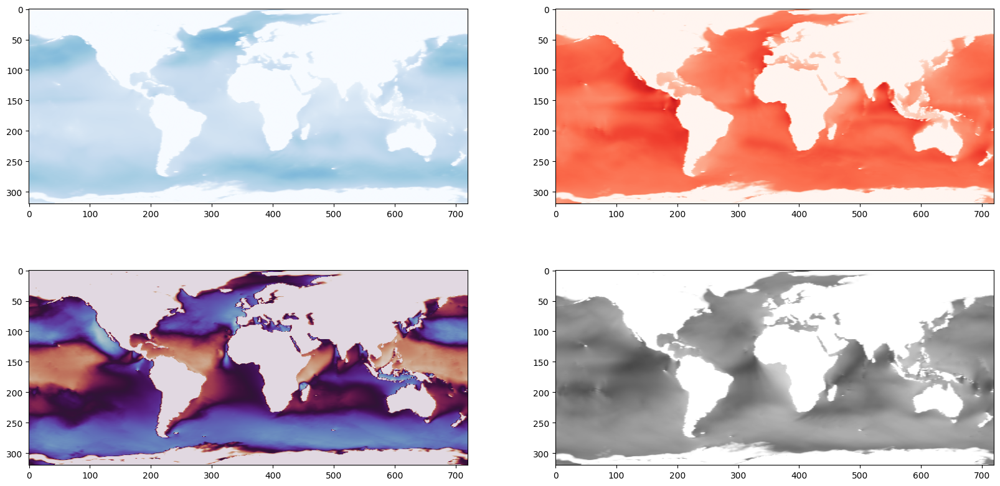

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(meanx_sampled[0,::-1], vmin=0, vmax=10, cmap='Blues')
img1 = axes[0,1].imshow(meanx_sampled[1,::-1], vmin=0, vmax=300, cmap='Reds')
img2 = axes[1,0].imshow(meanx_sampled[2,::-1], vmin=0, vmax=360, cmap='twilight_r')
img3 = axes[1,1].imshow(meanx_sampled[3,::-1], vmin=0, vmax=90, cmap='Greys')

#### Truth

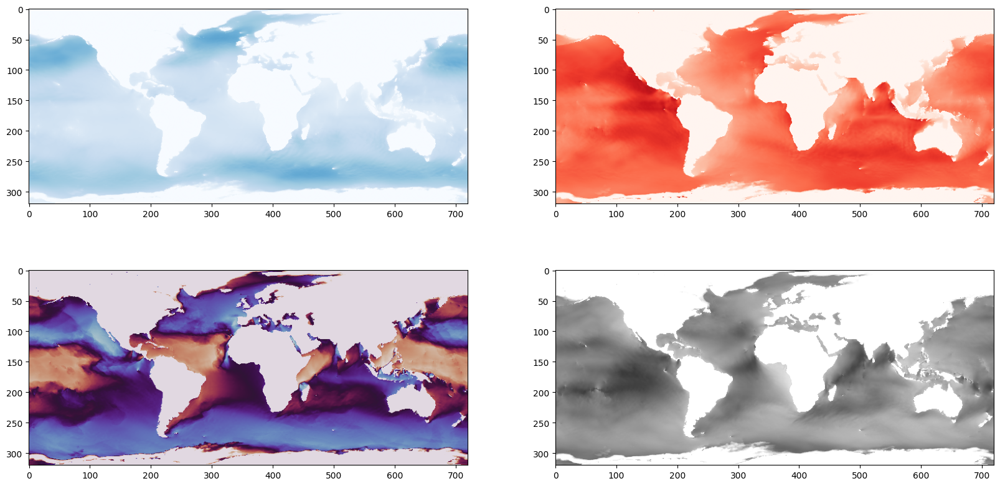

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(meanx[0,::-1], vmin=0, vmax=10, cmap='Blues')
img1 = axes[0,1].imshow(meanx[1,::-1], vmin=0, vmax=300, cmap='Reds')
img2 = axes[1,0].imshow(meanx[2,::-1], vmin=0, vmax=360, cmap='twilight_r')
img3 = axes[1,1].imshow(meanx[3,::-1], vmin=0, vmax=90, cmap='Greys')

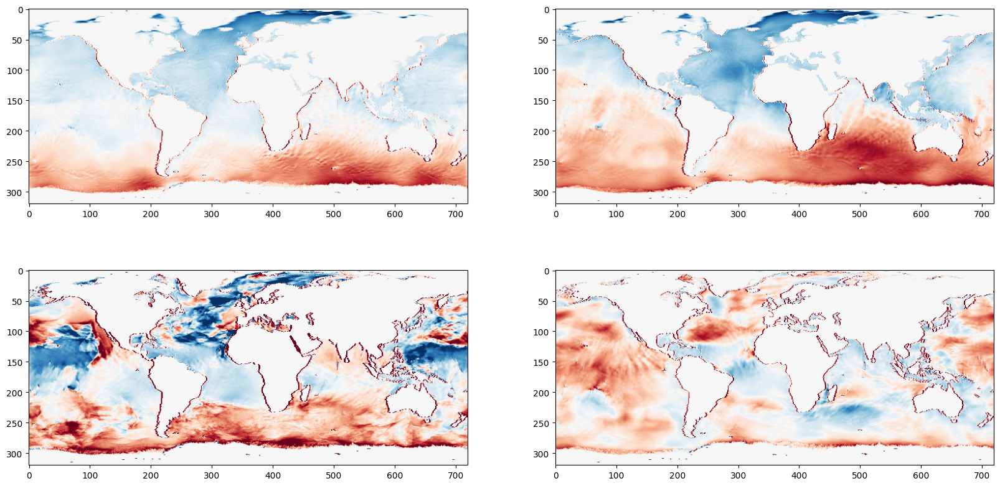

In [40]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(meanx[0,::-1] - meanx_sampled[0,::-1], vmin=-1, vmax=1, cmap='RdBu_r')
img1 = axes[0,1].imshow(meanx[1,::-1] - meanx_sampled[1,::-1], vmin=-50, vmax=50, cmap='RdBu_r')
img2 = axes[1,0].imshow(meanx[2,::-1] - meanx_sampled[2,::-1], vmin=-30, vmax=30, cmap='RdBu_r')
img3 = axes[1,1].imshow(meanx[3,::-1] - meanx_sampled[3,::-1], vmin=-10, vmax=10, cmap='RdBu_r')

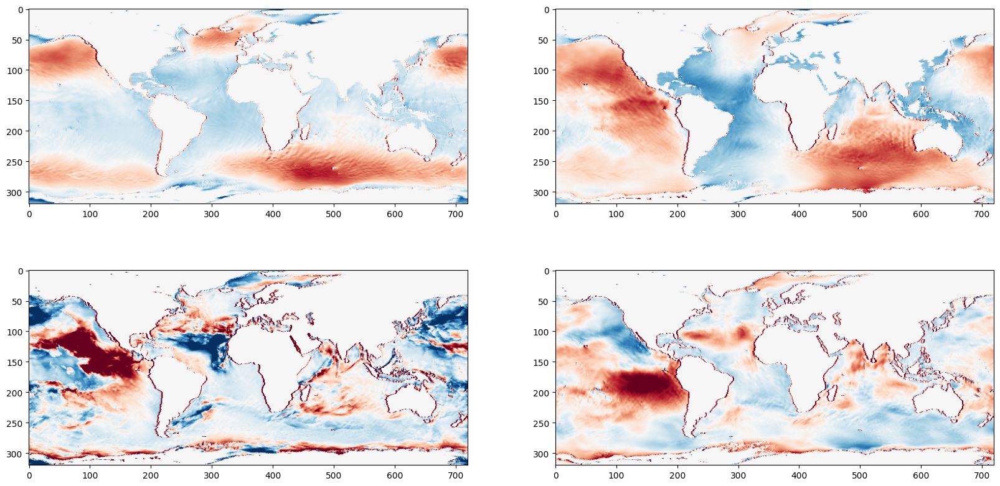

In [11]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(meanx[0,::-1] - meanx_sampled[0,::-1], vmin=-1, vmax=1, cmap='RdBu_r')
img1 = axes[0,1].imshow(meanx[1,::-1] - meanx_sampled[1,::-1], vmin=-50, vmax=50, cmap='RdBu_r')
img2 = axes[1,0].imshow(meanx[2,::-1] - meanx_sampled[2,::-1], vmin=-30, vmax=30, cmap='RdBu_r')
img3 = axes[1,1].imshow(meanx[3,::-1] - meanx_sampled[3,::-1], vmin=-10, vmax=10, cmap='RdBu_r')

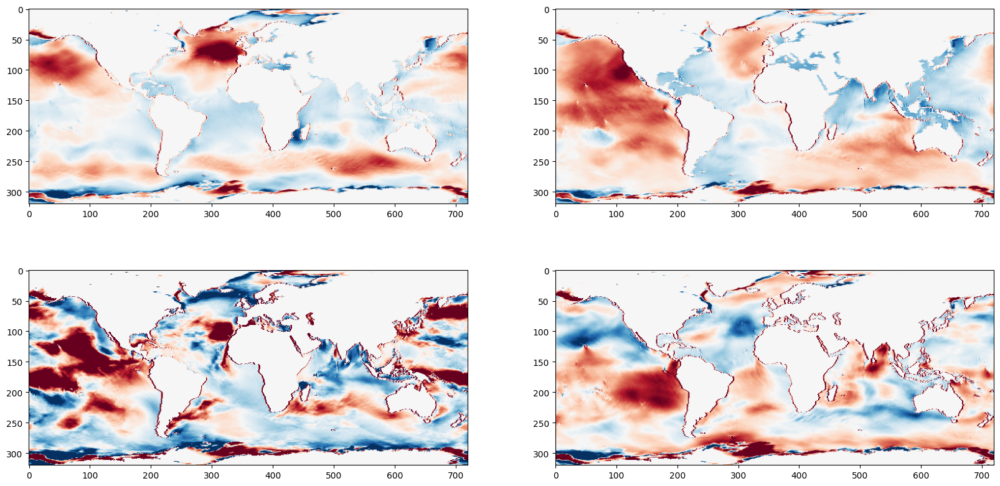

In [13]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(meanx[0,::-1] - meanx_sampled[0,::-1], vmin=-1, vmax=1, cmap='RdBu_r')
img1 = axes[0,1].imshow(meanx[1,::-1] - meanx_sampled[1,::-1], vmin=-50, vmax=50, cmap='RdBu_r')
img2 = axes[1,0].imshow(meanx[2,::-1] - meanx_sampled[2,::-1], vmin=-30, vmax=30, cmap='RdBu_r')
img3 = axes[1,1].imshow(meanx[3,::-1] - meanx_sampled[3,::-1], vmin=-10, vmax=10, cmap='RdBu_r')

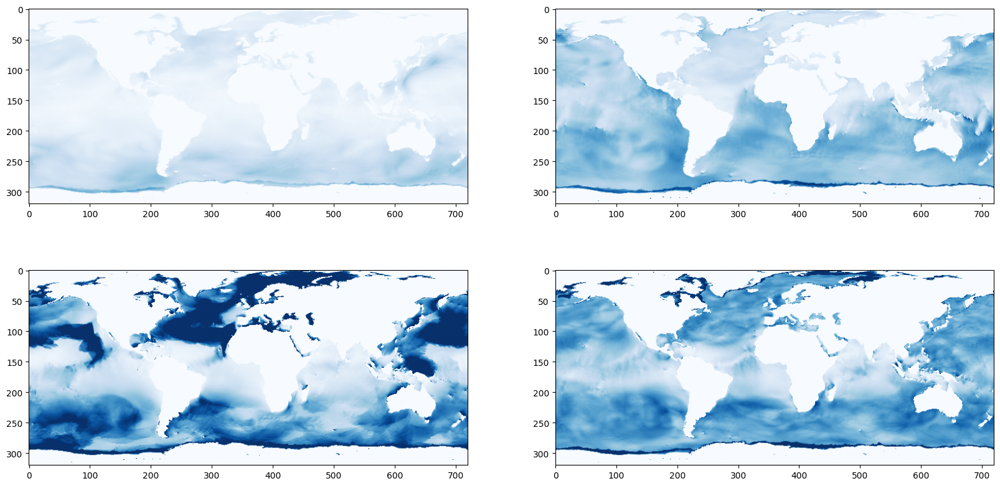

In [22]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(stdx[0,::-1], vmin=0, vmax=5, cmap='Blues')
img1 = axes[0,1].imshow(stdx[1,::-1], vmin=0, vmax=100, cmap='Blues')
img2 = axes[1,0].imshow(stdx[2,::-1], vmin=0, vmax=90, cmap='Blues')
img3 = axes[1,1].imshow(stdx[3,::-1], vmin=0, vmax=20, cmap='Blues')

/tmp/ipykernel_1269449/3188290743.py:2: RuntimeWarning: divide by zero encountered in divide
  img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:2: RuntimeWarning: invalid value encountered in divide
  img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:3: RuntimeWarning: divide by zero encountered in divide
  img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:3: RuntimeWarning: invalid value encountered in divide
  img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:4: RuntimeWarning: divide by zero encountered in divide
  img2 = axes[1,0].imshow(stdx_sampled[2,::-1]/stdx[2,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:4: RuntimeWarning: i

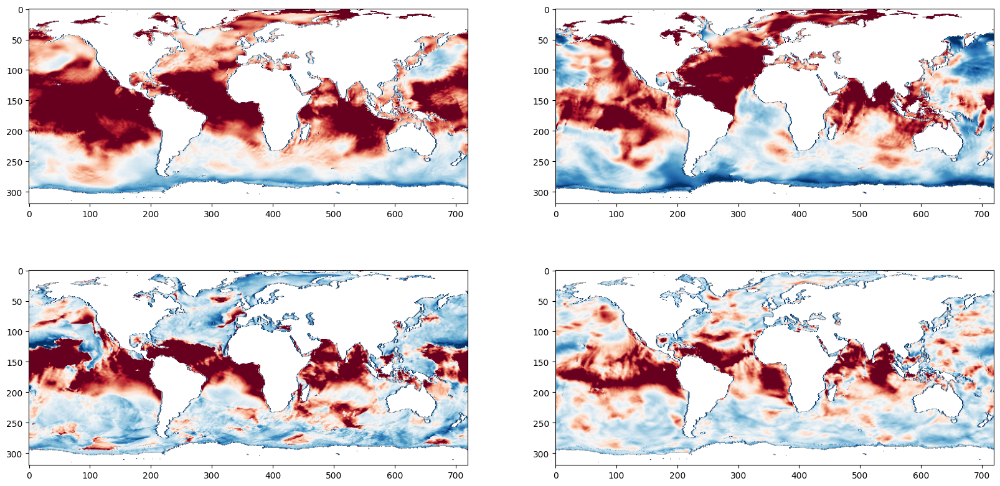

In [28]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img2 = axes[1,0].imshow(stdx_sampled[2,::-1]/stdx[2,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img3 = axes[1,1].imshow(stdx_sampled[3,::-1]/stdx[3,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')

/tmp/ipykernel_1269449/3188290743.py:2: RuntimeWarning: divide by zero encountered in divide
  img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:2: RuntimeWarning: invalid value encountered in divide
  img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:3: RuntimeWarning: divide by zero encountered in divide
  img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:3: RuntimeWarning: invalid value encountered in divide
  img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:4: RuntimeWarning: divide by zero encountered in divide
  img2 = axes[1,0].imshow(stdx_sampled[2,::-1]/stdx[2,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:4: RuntimeWarning: i

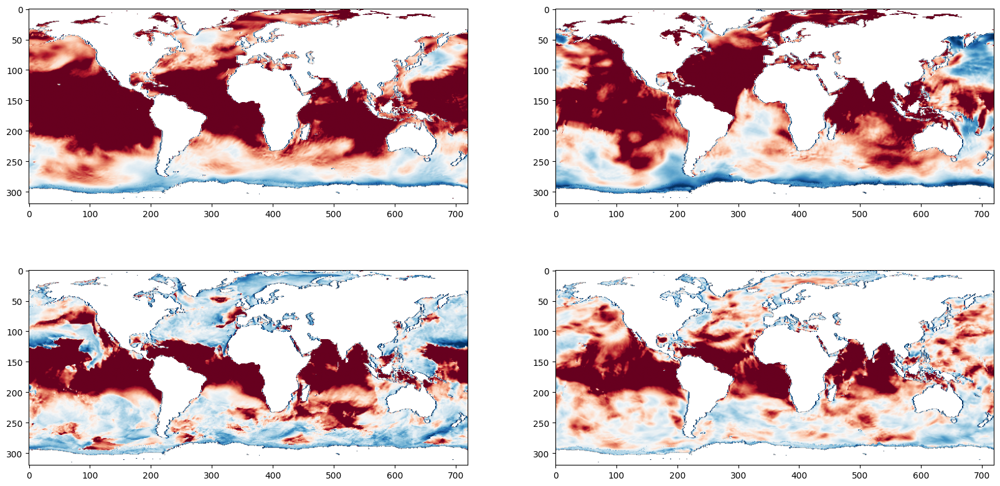

In [30]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img2 = axes[1,0].imshow(stdx_sampled[2,::-1]/stdx[2,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img3 = axes[1,1].imshow(stdx_sampled[3,::-1]/stdx[3,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')

/tmp/ipykernel_1269449/3188290743.py:2: RuntimeWarning: divide by zero encountered in divide
  img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:2: RuntimeWarning: invalid value encountered in divide
  img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:3: RuntimeWarning: divide by zero encountered in divide
  img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:3: RuntimeWarning: invalid value encountered in divide
  img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:4: RuntimeWarning: divide by zero encountered in divide
  img2 = axes[1,0].imshow(stdx_sampled[2,::-1]/stdx[2,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:4: RuntimeWarning: i

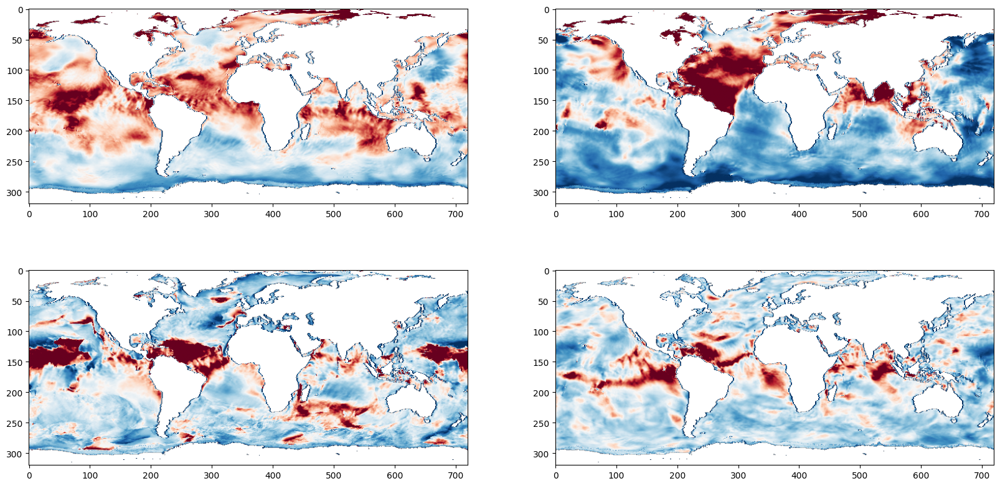

In [32]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img2 = axes[1,0].imshow(stdx_sampled[2,::-1]/stdx[2,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img3 = axes[1,1].imshow(stdx_sampled[3,::-1]/stdx[3,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')

/tmp/ipykernel_1269449/3188290743.py:2: RuntimeWarning: divide by zero encountered in divide
  img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:2: RuntimeWarning: invalid value encountered in divide
  img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:3: RuntimeWarning: divide by zero encountered in divide
  img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:3: RuntimeWarning: invalid value encountered in divide
  img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:4: RuntimeWarning: divide by zero encountered in divide
  img2 = axes[1,0].imshow(stdx_sampled[2,::-1]/stdx[2,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
/tmp/ipykernel_1269449/3188290743.py:4: RuntimeWarning: i

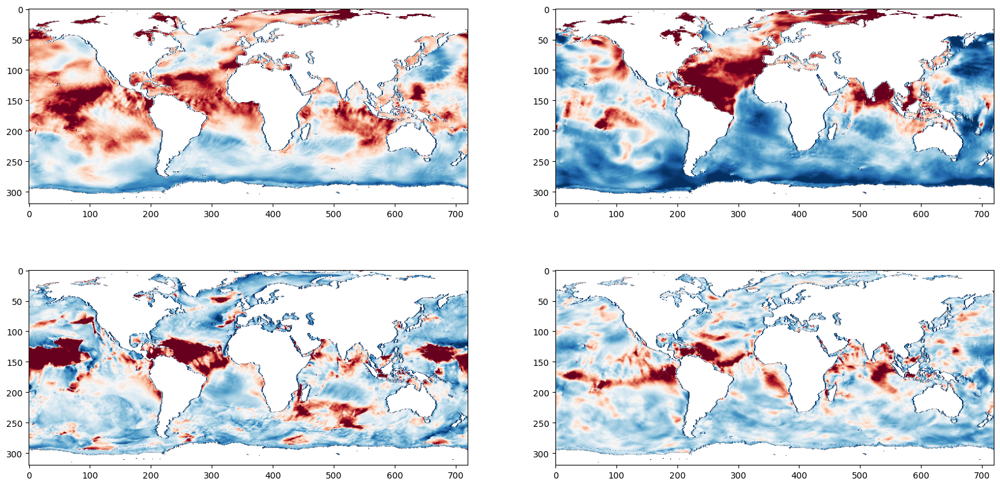

In [37]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
img0 = axes[0,0].imshow(stdx_sampled[0,::-1]/stdx[0,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img1 = axes[0,1].imshow(stdx_sampled[1,::-1]/stdx[1,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img2 = axes[1,0].imshow(stdx_sampled[2,::-1]/stdx[2,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')
img3 = axes[1,1].imshow(stdx_sampled[3,::-1]/stdx[3,::-1], vmin=0.5, vmax=1.5, cmap='RdBu_r')